## 1) Solution interactive permmettant d'afficher les prénoms donnés en fonction de leur fréquence, par département et par année :

In [2]:
import altair as alt
import pandas as pd
import geopandas as gpd
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display, HTML
import matplotlib.animation as animation
from tqdm.notebook import tqdm
alt.data_transformers.enable('json')
pass

names = pd.read_csv("dpt2020.csv", sep=";")
names.drop(names[names.preusuel == '_PRENOMS_RARES'].index, inplace=True)
names.drop(names[names.dpt == 'XX'].index, inplace=True)
just_names = names
depts = gpd.read_file('departements-avec-outre-mer.geojson')
names_grouped_by_name = names.groupby(['preusuel', 'annais', 'sexe']).nombre.sum().reset_index()
names = depts.merge(names, how='right', left_on='code', right_on='dpt')

years = sorted(names['annais'].unique().tolist(), reverse=True)
departments = sorted(names['nom'].dropna().unique().tolist())
departments.insert(0, 'Tous les départements')

def generate_wordcloud(department, year, axes, fig):
    if department == 'Tous les départements':
        df_filtered = names_grouped_by_name[names_grouped_by_name['annais'] == str(year)]
        code = '--'
    else:
        df_filtered = names[(names['nom'] == str(department)) &
                                            (names['annais'] == str(year))]
        dpts_data = names.loc[names['nom'] == department]
        code = dpts_data['code'].iloc[0]
        if code is None:
            code = 'code unfound'
    
    if df_filtered.empty:
        print(f"No data for year {year} and department {department}")
        axes[0].set_title('Pas de données', color='red', fontsize=20, pad=20)
        axes[0].imshow([], interpolation='bilinear')
        axes[0].axis('off')
        axes[1].set_title('Pas de données', color='red', fontsize=20, pad=20)
        axes[1].imshow([], interpolation='bilinear')
        axes[1].axis('off')
        fig.text(0.5, 0.5, f'Année : {year}', fontsize=50, color='black', ha='center')
        fig.text(0.5, 0.45, f'{department} ({code})', fontsize=25, color='grey', ha='center')
        return

    df_male = df_filtered[df_filtered['sexe'] == 1].groupby('preusuel', as_index=False)['nombre'].sum()
    df_female = df_filtered[df_filtered['sexe'] == 2].groupby('preusuel', as_index=False)['nombre'].sum()

    if df_male.empty and df_female.empty:
        print(f"No male or female names for year {year} and department {department}")
        axes[0].set_title('Pas de données pour les prénoms masculins', color='red', fontsize=20, pad=20)
        axes[0].imshow([], interpolation='bilinear')
        axes[0].axis('off')
        axes[1].set_title('Pas de données pour les prénoms féminins', color='red', fontsize=20, pad=20)
        axes[1].imshow([], interpolation='bilinear')
        axes[1].axis('off')
        fig.text(0.5, 0.5, f'Année : {year}', fontsize=40, color='black', ha='center')
        fig.text(0.5, 0.45, f'{department} ({code})', fontsize=25, color='grey', ha='center')
        return

    male_freq = dict(zip(df_male['preusuel'], df_male['nombre']))
    female_freq = dict(zip(df_female['preusuel'], df_female['nombre']))

    if not male_freq and not female_freq:
        print(f"No frequencies found for year {year} and department {department}")
        axes[0].set_title('Pas de données', color='red', fontsize=20, pad=20)
        axes[0].imshow([], interpolation='bilinear')
        axes[0].axis('off')
        axes[1].set_title('Pas de données', color='red', fontsize=20, pad=20)
        axes[1].imshow([], interpolation='bilinear')
        axes[1].axis('off')
        fig.text(0.5, 0.5, f'Année : {year}', fontsize=50, color='black', ha='center')
        fig.text(0.5, 0.45, f'{department} ({code})', fontsize=25, color='grey', ha='center')
        return

    wordcloud_male = WordCloud(width=1200, height=500, background_color='white').generate_from_frequencies(male_freq)
    wordcloud_female = WordCloud(width=1200, height=500, background_color='white').generate_from_frequencies(female_freq)

    axes[0].clear()
    if male_freq:
        axes[0].set_title('Prénoms masculins', color='blue', fontsize=20, pad=20)
        axes[0].imshow(wordcloud_male, interpolation='bilinear')
    else:
        axes[0].set_title('Pas de données pour les prénoms masculins', color='red', fontsize=20, pad=20)
    axes[0].axis('off')

    axes[1].clear()
    if female_freq:
        axes[1].set_title('Prénoms féminins', color='#FF1493', fontsize=20, pad=20)
        axes[1].imshow(wordcloud_female, interpolation='bilinear')
    else:
        axes[1].set_title('Pas de données pour les prénoms féminins', color='red', fontsize=20, pad=20)
    axes[1].axis('off')

    fig.texts.clear()
    fig.text(0.5, 0.90, f'Année : {year}', fontsize=40, color='black', ha='center')
    fig.text(0.5, 0.85, f'{department} ({code})', fontsize=25, color='grey', ha='center')
    plt.tight_layout(pad=3.0)

def update_wordcloud(department, year):
    fig, axes = plt.subplots(1, 2, figsize=(20, 10)) 
    generate_wordcloud(department, year, axes, fig)
    plt.show()

department_selector = widgets.Dropdown(
    options=departments,
    description='Département:',
    disabled=False,
    style={'description_width': 'initial'}
)

year_selector = widgets.Dropdown(
    options=years,
    description='Année:',
    disabled=False,
    style={'description_width': 'initial'}
)

widgets.interact(update_wordcloud, department=department_selector, year=year_selector)

interactive(children=(Dropdown(description='Département:', options=('Tous les départements', 'Ain', 'Aisne', '…

<function __main__.update_wordcloud(department, year)>

## 2) Pour créer l'animation GIF qui présente l'évolution des graphes au fil des années :

Création de l'animation:   0%|          | 0/10 [00:00<?, ?it/s]

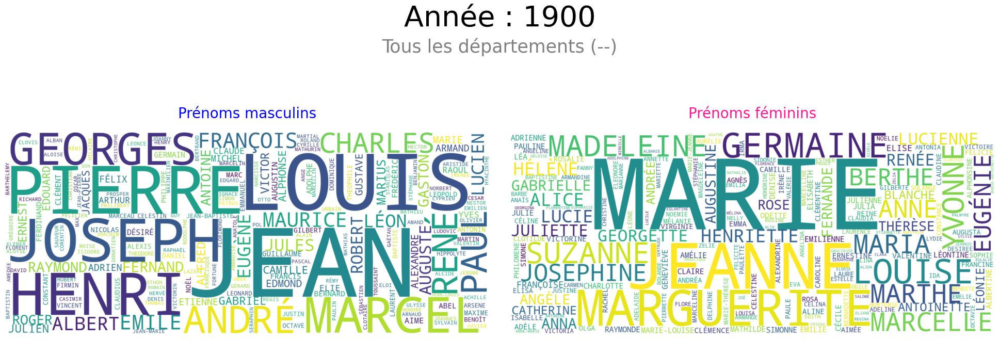

In [3]:
import altair as alt
import pandas as pd
import geopandas as gpd
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display, HTML
import matplotlib.animation as animation
from tqdm.notebook import tqdm
alt.data_transformers.enable('json')
pass

names = pd.read_csv("dpt2020.csv", sep=";")
names.drop(names[names.preusuel == '_PRENOMS_RARES'].index, inplace=True)
names.drop(names[names.dpt == 'XX'].index, inplace=True)
just_names = names
depts = gpd.read_file('departements-avec-outre-mer.geojson')
names_grouped_by_name = names.groupby(['preusuel', 'annais', 'sexe']).nombre.sum().reset_index()
names = depts.merge(names, how='right', left_on='code', right_on='dpt')

years = sorted(names['annais'].unique().tolist(), reverse=True)
departments = sorted(names['nom'].dropna().unique().tolist())
departments.insert(0, 'Tous les départements')

def generate_wordcloud(department, year, axes, fig):
    if department == 'Tous les départements':
        df_filtered = names_grouped_by_name[names_grouped_by_name['annais'] == str(year)]
        code = '--'
    else:
        df_filtered = names[(names['nom'] == str(department)) &
                                            (names['annais'] == str(year))]
        dpts_data = names.loc[names['nom'] == department]
        code = dpts_data['code'].iloc[0]
        if code is None:
            code = 'code unfound'
    
    if df_filtered.empty:
        print(f"No data for year {year} and department {department}")
        axes[0].set_title('Pas de données', color='red', fontsize=20, pad=20)
        axes[0].imshow([], interpolation='bilinear')
        axes[0].axis('off')
        axes[1].set_title('Pas de données', color='red', fontsize=20, pad=20)
        axes[1].imshow([], interpolation='bilinear')
        axes[1].axis('off')
        fig.text(0.5, 0.5, f'Année : {year}', fontsize=50, color='black', ha='center')
        fig.text(0.5, 0.45, f'{department} ({code})', fontsize=25, color='grey', ha='center')
        return

    df_male = df_filtered[df_filtered['sexe'] == 1].groupby('preusuel', as_index=False)['nombre'].sum()
    df_female = df_filtered[df_filtered['sexe'] == 2].groupby('preusuel', as_index=False)['nombre'].sum()

    if df_male.empty and df_female.empty:
        print(f"No male or female names for year {year} and department {department}")
        axes[0].set_title('Pas de données pour les prénoms masculins', color='red', fontsize=20, pad=20)
        axes[0].imshow([], interpolation='bilinear')
        axes[0].axis('off')
        axes[1].set_title('Pas de données pour les prénoms féminins', color='red', fontsize=20, pad=20)
        axes[1].imshow([], interpolation='bilinear')
        axes[1].axis('off')
        fig.text(0.5, 0.5, f'Année : {year}', fontsize=40, color='black', ha='center')
        fig.text(0.5, 0.45, f'{department} ({code})', fontsize=25, color='grey', ha='center')
        return

    male_freq = dict(zip(df_male['preusuel'], df_male['nombre']))
    female_freq = dict(zip(df_female['preusuel'], df_female['nombre']))

    if not male_freq and not female_freq:
        print(f"No frequencies found for year {year} and department {department}")
        axes[0].set_title('Pas de données', color='red', fontsize=20, pad=20)
        axes[0].imshow([], interpolation='bilinear')
        axes[0].axis('off')
        axes[1].set_title('Pas de données', color='red', fontsize=20, pad=20)
        axes[1].imshow([], interpolation='bilinear')
        axes[1].axis('off')
        fig.text(0.5, 0.5, f'Année : {year}', fontsize=50, color='black', ha='center')
        fig.text(0.5, 0.45, f'{department} ({code})', fontsize=25, color='grey', ha='center')
        return

    wordcloud_male = WordCloud(width=1200, height=500, background_color='white').generate_from_frequencies(male_freq)
    wordcloud_female = WordCloud(width=1200, height=500, background_color='white').generate_from_frequencies(female_freq)

    axes[0].clear()
    if male_freq:
        axes[0].set_title('Prénoms masculins', color='blue', fontsize=20, pad=20)
        axes[0].imshow(wordcloud_male, interpolation='bilinear')
    else:
        axes[0].set_title('Pas de données pour les prénoms masculins', color='red', fontsize=20, pad=20)
    axes[0].axis('off')

    axes[1].clear()
    if female_freq:
        axes[1].set_title('Prénoms féminins', color='#FF1493', fontsize=20, pad=20)
        axes[1].imshow(wordcloud_female, interpolation='bilinear')
    else:
        axes[1].set_title('Pas de données pour les prénoms féminins', color='red', fontsize=20, pad=20)
    axes[1].axis('off')

    fig.texts.clear()
    fig.text(0.5, 0.90, f'Année : {year}', fontsize=40, color='black', ha='center')
    fig.text(0.5, 0.85, f'{department} ({code})', fontsize=25, color='grey', ha='center')
    plt.tight_layout(pad=3.0)

def create_animation():
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))

    def update(year):
        generate_wordcloud('Tous les départements', year, axes, fig)
        return axes

    frames = [1900, 1920, 1940, 1960, 1970, 1980, 1990, 2000, 2010, 2020]
    progress_bar = tqdm(total=len(frames), desc="Création de l'animation")

    def update_progress_bar(frame):
        update(frame)
        progress_bar.update()

    Writer = animation.PillowWriter
    writer = Writer(fps=1)

    ani = animation.FuncAnimation(fig, update_progress_bar, frames=frames, blit=False)
    ani.save('wordcloud_animation.gif', writer=writer)
    progress_bar.close()
    return ani

ani = create_animation()

HTML(ani.to_jshtml())